In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Setting up directory and unziping files

In [2]:
import shutil
import zipfile
import datetime

In [4]:
train_dir = './train'
test_dir = './test1'
train_zip = '../input/dogs-vs-cats/train.zip'
test_zip = '../input/dogs-vs-cats/test1.zip'

if not os.path.exists(train_dir):
       
    with zipfile.ZipFile(train_zip,'r') as f:
        f.extractall()
    
    with zipfile.ZipFile(test_zip,'r') as f:
        f.extractall()
       
    os.makedirs(train_dir+'/dog')
    os.makedirs(train_dir+'/cat')
    
    # shift dogs to /train/dog and cats to /train/cats
    filenames = os.listdir(train_dir)

    for filename in filenames:
        try:
            if filename.split('.')[0]=='cat':
                shutil.move(os.path.join(train_dir,filename),os.path.join(train_dir,'cat',filename))
            elif filename.split('.')[0]=='dog':
                shutil.move(os.path.join(train_dir,filename),os.path.join(train_dir,'dog',filename))
            else:
                print(f"no cat or dog label for {filename}")
        except:
            continue
else:
    print(f"{train_dir} exists!")

./train exists!


In [3]:
import torch
import torchvision
import torchvision.transforms as transforms
import torch.optim as optim
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
from torchvision.models import vgg19, resnet50, inception_v3
from torchvision.models import efficientnet_b2, mobilenet_v3_small
from torch.optim import lr_scheduler

import numpy as np
import matplotlib.pyplot as plt
import random

from sklearn.metrics import confusion_matrix, classification_report
from PIL import Image
from datetime import datetime

c:\ProgramData\miniconda3\lib\site-packages\tqdm\auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [6]:
def set_seed(seed):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.benchmark = False
    torch.backends.cudnn.deterministic = True
    
set_seed(888)

# Loading dataset and defining model architecture

## Setting up dataloaders for dataset loading and splitting

In [8]:
class TestDataset(torch.utils.data.Dataset): #test dataset without labels
    def __init__(self,c,h,w,mean_val,std_val,transform,test_dir='test1'):
        self.test_dir = test_dir
        self.C, self.H, self.W = c,h,w
        self.mean_val = mean_val
        self.std_val = std_val
        self.filenames = os.listdir(test_dir)
        
        self.transform = transform
        
    def __len__(self):
        return len(self.filenames)

    def __getitem__(self,index):
        if torch.is_tensor(index):
            index = index.tolist()
        image_path = self.filenames[index]
        x = Image.open(os.path.join(self.test_dir,image_path))
        x = self.transform(x)

        return x

In [9]:
class DataManager:
    def __init__(self, root='.',train_dir='train',test_dir='test1',val_split=0.1):
        self.C, self.H, self.W = 3, 224, 224
        self.mean_val = [0.485, 0.456, 0.406]
        self.std_val = [0.229, 0.224, 0.225]
        
        self.transform = transforms.Compose([
                transforms.ToTensor(),
                transforms.Resize(size=(self.H,self.W)),
                transforms.Normalize(self.mean_val, self.std_val)
            ])
               
        self.transform_ag = transforms.Compose([ #with augmentations for training
            transforms.ColorJitter(
                brightness=0.10, contrast=0.10, saturation=0.10, hue=0.10
            ),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.5),
            transforms.RandomRotation(degrees=15),
            transforms.RandomResizedCrop(
                size=(self.H,self.W), scale=(0.90, 1.00), ratio=(0.90, 1.10)
            ),
            transforms.ToTensor(),
            transforms.Normalize(self.mean_val, self.std_val)
        ])

        custom_dir = os.path.join(root)
        
        self.dataset = torchvision.datasets.ImageFolder(
                os.path.join(custom_dir,train_dir), 
                transform = self.transform_ag
            )
        
        n_valid = int(np.floor(val_split*len(self.dataset)))
        n_train = len(self.dataset) - n_valid
        
        self.trainset,self.validset = torch.utils.data.random_split(self.dataset,[n_train,n_valid])
        
        self.testset = TestDataset(self.C, self.H, self.W,self.mean_val,self.std_val,test_dir=test_dir,transform=self.transform)
            
        self.class_to_idx = self.dataset.class_to_idx #for multiclass split into directories
        self.classes = list(self.class_to_idx.keys())
        self.get_loader()

    def get_loader(self):
        self.batch_size = 16
        
        self.trainloader = torch.utils.data.DataLoader(
            self.trainset, batch_size=self.batch_size,
            shuffle=True, num_workers=0
        )
        
        self.validloader = torch.utils.data.DataLoader(
            self.validset, batch_size=self.batch_size,
            shuffle=True, num_workers=0
        )
               
        self.testloader = torch.utils.data.DataLoader(
            self.testset,batch_size=self.batch_size,
            shuffle=False,num_workers=0
        )
        
    def show_sample_images_hist(self,dataset='train'):
        
        if dataset == 'train':
            data = next(iter(self.trainloader))
            images_bchw, y_true = data
            print(images_bchw.shape, y_true.shape)
        elif dataset == 'test':
            file_names = self.testset.filenames[:self.batch_size]
            data = next(iter(self.testloader))
            images_bchw = data
            
        
        fig, axes = plt.subplots(2,2,figsize=(20,12))
        images_bhwc = np.transpose(
            images_bchw.numpy(), (0,2,3,1)
        )
        axes[0,0].imshow(images_bhwc[0,])
        axes[0,1].imshow(images_bhwc[1,])
        axes[1,0].imshow(images_bhwc[2,])
        axes[1,1].imshow(images_bhwc[3,])
        
        if dataset=='train':
            axes[0,0].set_title(f"{self.classes[y_true[0]]}")
            axes[0,1].set_title(f"{self.classes[y_true[1]]}")
            axes[1,0].set_title(f"{self.classes[y_true[2]]}")
            axes[1,1].set_title(f"{self.classes[y_true[3]]}")
        elif dataset == 'test':
            axes[0,0].set_title(f"{file_names[0]}")
            axes[0,1].set_title(f"{file_names[1]}")
            axes[1,0].set_title(f"{file_names[2]}")
            axes[1,1].set_title(f"{file_names[3]}")
            
        plt.tight_layout()
        plt.suptitle("Sample images with augmentations")
        plt.show()
        
        plt.figure()
        plt.hist(images_bhwc.flatten())
        plt.show()
       

## Setting up a basic CNN architecture

In [10]:
class Net(nn.Module):
    def __init__(self):
        super().__init__()
        
        self.conv1a = nn.Conv2d(3,16,9,padding=4,stride=2)
        self.conv1b = nn.Conv2d(16,16,9,padding=4,stride=2)
        self.bn1 = nn.BatchNorm2d(16) #28

        self.conv2a = nn.Conv2d(16,32,9,padding=4)
        self.conv2b = nn.Conv2d(32,32,9,padding=4)
        self.bn2 = nn.BatchNorm2d(32) #14

        self.conv3a = nn.Conv2d(32,64,9,padding=4)
        self.conv3b = nn.Conv2d(64,64,9,padding=4)
        self.bn3 = nn.BatchNorm2d(64) #7

        self.conv4a = nn.Conv2d(64,128,9,padding=4)
        self.conv4b = nn.Conv2d(128,128,9,padding=4)
        self.bn4 = nn.BatchNorm2d(128) #3

        self.fc1 = nn.Linear(128*3*3,512)
        self.fc2 = nn.Linear(512,64)
        self.fc3 = nn.Linear(64,1)

        self.relu = nn.ReLU()
        self.pool = nn.MaxPool2d(2,2)
        self.drop = nn.Dropout(0.1)

    def forward(self, x):
        x = self.drop(self.pool(self.bn1(self.relu(self.conv1b(self.relu(self.conv1a(x)))))))
        x = self.drop(self.pool(self.bn2(self.relu(self.conv2b(self.relu(self.conv2a(x)))))))
        x = self.drop(self.pool(self.bn3(self.relu(self.conv3b(self.relu(self.conv3a(x)))))))
        x = self.drop(self.pool(self.bn4(self.relu(self.conv4b(self.relu(self.conv4a(x)))))))

        x = torch.flatten(x, 1) 
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        output = self.fc3(x)
        
        return output

## Setting up classifier

In [11]:
class Classifier:
    def __init__(self, dataManager, model_name = 'custom', load_model= False , model_file = None):
        """
        Args:
            dataManager : DataManager object for loading of data
        """
        self.dataMananger = dataManager
        self.trainloader = self.dataMananger.trainloader
        self.validloader = self.dataMananger.validloader
        self.testloader = self.dataMananger.testloader
        self.classes = self.dataMananger.classes
        
        self.artifacts_dir = "./artifact/"
        if not os.path.exists(self.artifacts_dir):
            os.makedirs(self.artifacts_dir)
        
        self.device = torch.device(
            # 'cuda:0' if torch.cuda.is_available() else 'cpu'
            torch.cuda.current_device() if torch.cuda.is_available() else 'cpu'
        )
        print("Using device %s" % self.device)
        
        self.model = self.get_model(model_name)
        
        if load_model is True:
            if model_file is None:
                self.load_model() #loads newest model file in self.artifacts_dir
            else:
                self.load_model(model_file)
        
        self.model.to(self.device)
   
        self.criterion = nn.BCEWithLogitsLoss() #default for binary prediction
    
    def get_model(self,model_name):
        
        if model_name == 'custom':
            model = Net()
        elif model_name=='vgg':
            model = vgg19(pretrained=True,num_classes=1000)
        elif model_name=='resnet':
            model = resnet50(pretrained=True,num_classes=1000)
        elif model_name=='inception':
            model = inception_v3(pretrained=True,num_classes=1000) #input size (299,299)
        elif model_name=='efficient':
            model = efficientnet_b2(pretrained=True,num_classes=1000)
        elif model_name=='mobile':
            model = mobilenet_v3_small(pretrained=True,num_classes=1000)
            
        return model
    
    def save_model(self):
        if not os.path.exists(self.artifacts_dir+"checkpoint/"):
            os.makedirs(self.artifacts_dir+"checkpoint/")
        
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        torch.save(
            self.model.state_dict(), 
            self.artifacts_dir+"checkpoint/model_%s.pt" % timestamp
        )
        print("model_%s.pt successfully saved!" % timestamp)
        return timestamp
    
    def load_model(self, filename=None):
        try:
            if filename is None:
                # get latest file (files are named by date_time)
                filename = sorted(os.listdir(self.artifacts_dir+"checkpoint/"))[-1]

            self.model.load_state_dict(torch.load("%s/checkpoint/%s" % (self.artifacts_dir, filename)))
            print("%s successfully loaded..." % filename)
        except:
            print("Unable to load %s..." % filename)
    
    
    def set_optimizer(self):
        self.optimizer = optim.Adam(self.model.parameters(), lr=self.lr)
    
    def set_scheduler(self):
        self.scheduler = lr_scheduler.CosineAnnealingWarmRestarts(self.optimizer, T_0=100, T_mult=1)

    def train(self, epochs=1, lr=1e-3, save=True):
        self.lr = lr
        self.set_optimizer()
        self.set_scheduler()
        
        history = []
        print(f"Beginning training for {epochs} epochs")
        print("lr: ", self.optimizer.param_groups[0]['lr'])
       
        min_valid_loss = np.inf
        
        for epoch in range(epochs):
            training_loss = 0.0
            training_corrects = 0
            training_total = 0
            self.model.train()
            for i, data in enumerate(self.trainloader):
                images, y_true = data
                images, y_true = images.to(self.device), y_true.to(self.device)
                y_true = y_true.float().unsqueeze(1)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                y_hat = torch.round(torch.sigmoid(outputs))

                loss = self.criterion(outputs, y_true)
                loss.backward()
                torch.nn.utils.clip_grad_norm_(self.model.parameters(), max_norm=1)
                self.optimizer.step()
                self.scheduler.step()
                
                training_total += y_true.size(0)
                training_loss += loss.item() * y_true.size(0)
                training_corrects += torch.sum(y_hat == y_true)

                if (i+1) % 100 == 0:
                    # print every N mini-batches
                    print(f"[Epoch {epoch + 1}, Batch {i + 1:3d}] Training loss: {training_loss:.3f}")

            self.model.eval()
            valid_loss = 0.0
            valid_corrects = 0
            valid_total = 0
            for images,y_true in self.validloader:
                images, y_true = images.to(self.device), y_true.to(self.device)
                y_true = y_true.float().unsqueeze(1)
                
                outputs = self.model(images)
                loss = self.criterion(outputs, y_true)
                y_hat = torch.round(torch.sigmoid(outputs))
                
                valid_total += y_true.size(0)
                valid_loss += loss.item() * y_true.size(0)
                valid_corrects += torch.sum(y_hat == y_true)
                
            epoch_train_loss = training_loss/training_total
            epoch_train_acc = training_corrects/training_total
            
            epoch_val_loss = valid_loss/valid_total
            epoch_val_acc = valid_corrects/valid_total
            history.append([epoch_train_loss,epoch_val_loss])
            
            print(f'Epoch: {epoch+1}/{epochs}:')
            print(f'Training loss: {epoch_train_loss:.5f} Epoch Train Acc: {epoch_train_acc:.5f}.')
            print(f'Validation loss: {epoch_val_loss:.5f} Epoch Validation Acc: {epoch_val_acc:.5f}.')
            
            if save and epoch_val_loss < min_valid_loss:
                print(f'Validation Loss Decreased ({min_valid_loss:.5f}---->{epoch_val_loss:.5f}) \t Saving Model..')
                min_valid_loss = epoch_val_loss
                
                timestamp = self.save_model()
                if not os.path.exists(self.artifacts_dir+"history/"):
                    os.makedirs(self.artifacts_dir+"history/")
                    
                fig,ax = plt.subplots(1,1,figsize=(8,8))
                ax.plot([x[0] for x in history],label='train')
                ax.plot([x[1] for x in history],label='val')
                ax.legend()
                ax.set_title("Training & Validation Loss")
                plt.savefig(self.artifacts_dir+"history/loss_%s.jpg"%timestamp)  
                plt.show()
        
    def test(self, on_train_set=False,print_report = True): #test data do not have labels
        predictions,probs = [],[]
        
        if on_train_set is True:
            print("Predicting on train set to get metrics")
            dataloader = self.trainloader
        else:
            print("Predicting on test set to get metrics")
            dataloader = self.testloader
        
        self.model.eval()
        test_size = 0
        
        with torch.no_grad():
            for i,data in enumerate(dataloader):
                images = data
                images = images.to(self.device)
                
                outputs = self.model(images)
                probabilities = torch.sigmoid(outputs)
                y_hat = torch.round(probabilities)
                
                predictions.extend(list(y_hat.cpu().detach().numpy()))
                probs.extend(probabilities.cpu().detach().numpy())
                
                test_size += images.size(0)
                
                if (i+1)%100==0:
                    print(f'Evaluating...Images {test_size}/{len(self.dataMananger.testset)}')
        
        return predictions,probs

In [25]:
dataset = DataManager()
classifier = Classifier(dataset)

Using device cuda:0


## Sample images from training set

torch.Size([16, 3, 224, 224]) torch.Size([16])


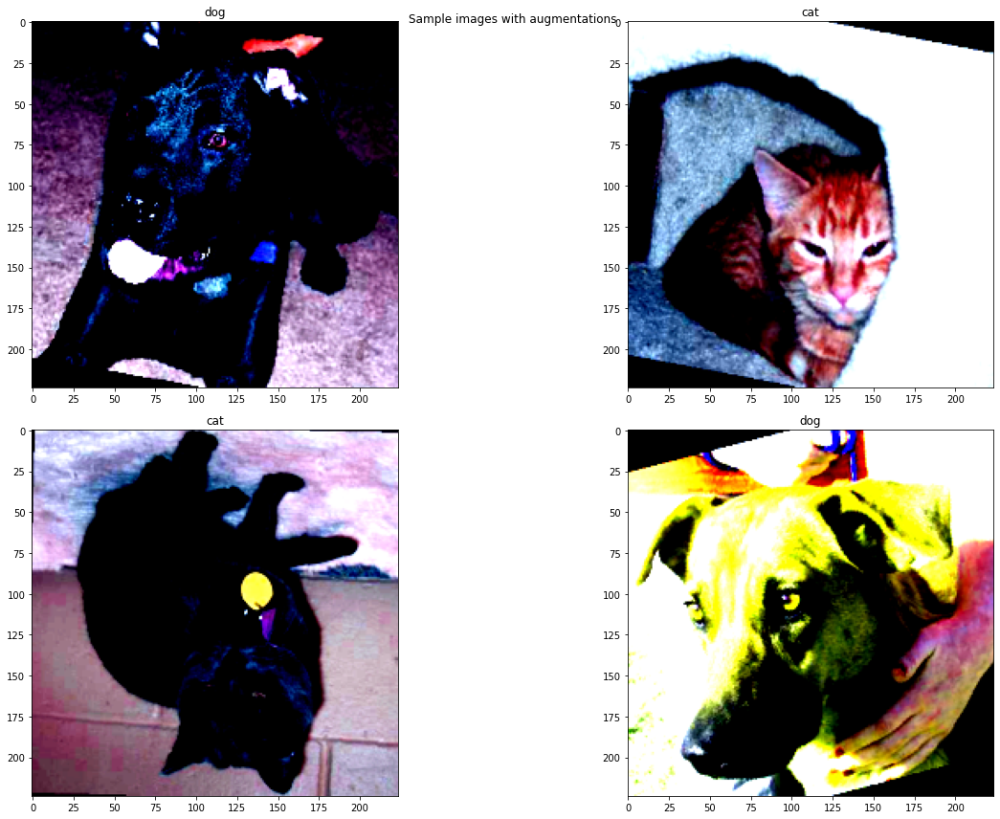

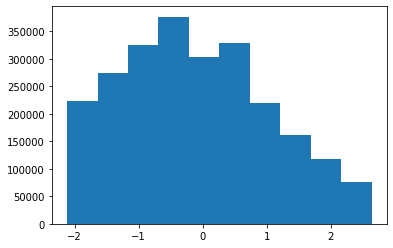

In [29]:
dataset.show_sample_images_hist(dataset='train')

# Model Training

Beginning training for 30 epochs
lr:  0.001
[Epoch 1, Batch 100] Training loss: 1120.596
[Epoch 1, Batch 200] Training loss: 2229.599
[Epoch 1, Batch 300] Training loss: 3337.855
[Epoch 1, Batch 400] Training loss: 4440.220
[Epoch 1, Batch 500] Training loss: 5537.744
[Epoch 1, Batch 600] Training loss: 6635.144
[Epoch 1, Batch 700] Training loss: 7740.756
[Epoch 1, Batch 800] Training loss: 8836.108
[Epoch 1, Batch 900] Training loss: 9921.394
[Epoch 1, Batch 1000] Training loss: 11009.166
[Epoch 1, Batch 1100] Training loss: 12097.795
[Epoch 1, Batch 1200] Training loss: 13157.514
[Epoch 1, Batch 1300] Training loss: 14221.536
[Epoch 1, Batch 1400] Training loss: 15323.056
Epoch: 1/30:
Training loss: 0.68407 Epoch Train Acc: 0.55853.
Validation loss: 0.68612 Epoch Validation Acc: 0.54320.
Validation Loss Decreased (inf---->0.68612) 	 Saving Model..
model_20221113_050058.pt successfully saved!


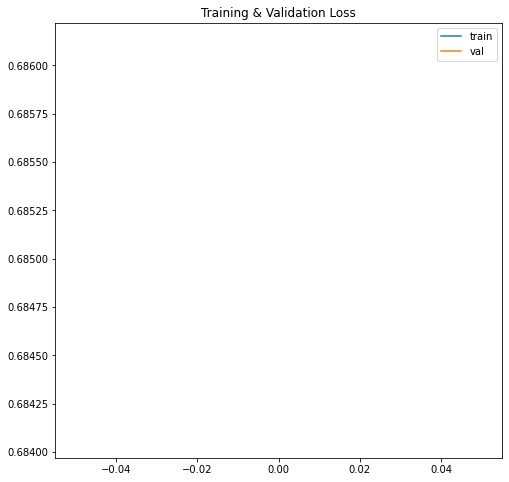

[Epoch 2, Batch 100] Training loss: 1085.518
[Epoch 2, Batch 200] Training loss: 2138.227
[Epoch 2, Batch 300] Training loss: 3204.992
[Epoch 2, Batch 400] Training loss: 4266.059
[Epoch 2, Batch 500] Training loss: 5321.869
[Epoch 2, Batch 600] Training loss: 6370.806
[Epoch 2, Batch 700] Training loss: 7431.710
[Epoch 2, Batch 800] Training loss: 8481.732
[Epoch 2, Batch 900] Training loss: 9581.320
[Epoch 2, Batch 1000] Training loss: 10658.440
[Epoch 2, Batch 1100] Training loss: 11717.109
[Epoch 2, Batch 1200] Training loss: 12755.813
[Epoch 2, Batch 1300] Training loss: 13766.551
[Epoch 2, Batch 1400] Training loss: 14789.866
Epoch: 2/30:
Training loss: 0.66023 Epoch Train Acc: 0.60764.
Validation loss: 0.63148 Epoch Validation Acc: 0.65880.
Validation Loss Decreased (0.68612---->0.63148) 	 Saving Model..
model_20221113_051119.pt successfully saved!


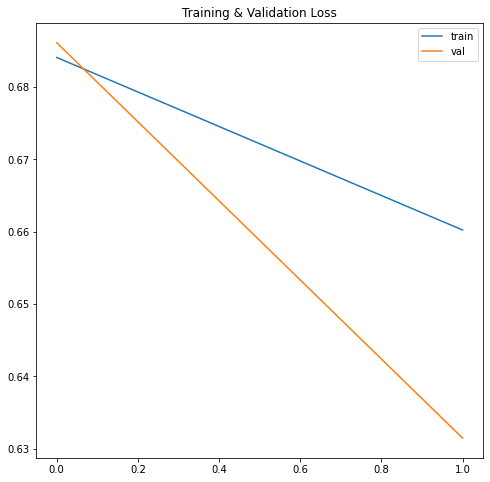

[Epoch 3, Batch 100] Training loss: 1026.065
[Epoch 3, Batch 200] Training loss: 2043.847
[Epoch 3, Batch 300] Training loss: 3058.689
[Epoch 3, Batch 400] Training loss: 4050.141
[Epoch 3, Batch 500] Training loss: 5053.773
[Epoch 3, Batch 600] Training loss: 6074.154
[Epoch 3, Batch 700] Training loss: 7048.097
[Epoch 3, Batch 800] Training loss: 8053.685
[Epoch 3, Batch 900] Training loss: 9041.390
[Epoch 3, Batch 1000] Training loss: 9997.857
[Epoch 3, Batch 1100] Training loss: 10988.584
[Epoch 3, Batch 1200] Training loss: 11983.575
[Epoch 3, Batch 1300] Training loss: 12970.693
[Epoch 3, Batch 1400] Training loss: 13914.001
Epoch: 3/30:
Training loss: 0.62101 Epoch Train Acc: 0.66213.
Validation loss: 0.62221 Epoch Validation Acc: 0.67720.
Validation Loss Decreased (0.63148---->0.62221) 	 Saving Model..
model_20221113_052142.pt successfully saved!


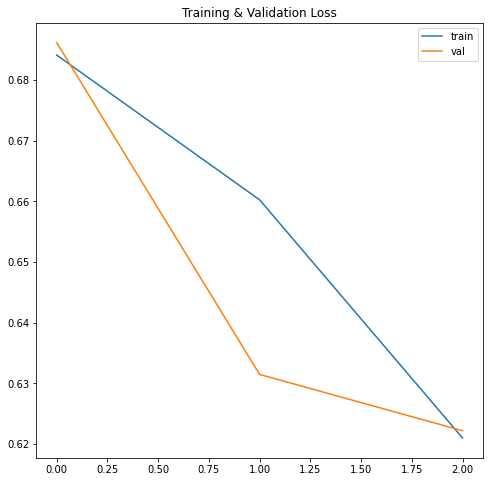

[Epoch 4, Batch 100] Training loss: 956.762
[Epoch 4, Batch 200] Training loss: 1888.189
[Epoch 4, Batch 300] Training loss: 2840.167
[Epoch 4, Batch 400] Training loss: 3798.493
[Epoch 4, Batch 500] Training loss: 4769.195
[Epoch 4, Batch 600] Training loss: 5711.746
[Epoch 4, Batch 700] Training loss: 6687.225
[Epoch 4, Batch 800] Training loss: 7646.814
[Epoch 4, Batch 900] Training loss: 8619.051
[Epoch 4, Batch 1000] Training loss: 9548.852
[Epoch 4, Batch 1100] Training loss: 10499.335
[Epoch 4, Batch 1200] Training loss: 11448.391
[Epoch 4, Batch 1300] Training loss: 12407.672
[Epoch 4, Batch 1400] Training loss: 13359.371
Epoch: 4/30:
Training loss: 0.59646 Epoch Train Acc: 0.68587.
Validation loss: 2.08817 Epoch Validation Acc: 0.63160.
[Epoch 5, Batch 100] Training loss: 985.879
[Epoch 5, Batch 200] Training loss: 1945.416
[Epoch 5, Batch 300] Training loss: 2903.772
[Epoch 5, Batch 400] Training loss: 3817.259
[Epoch 5, Batch 500] Training loss: 4750.725
[Epoch 5, Batch 600]

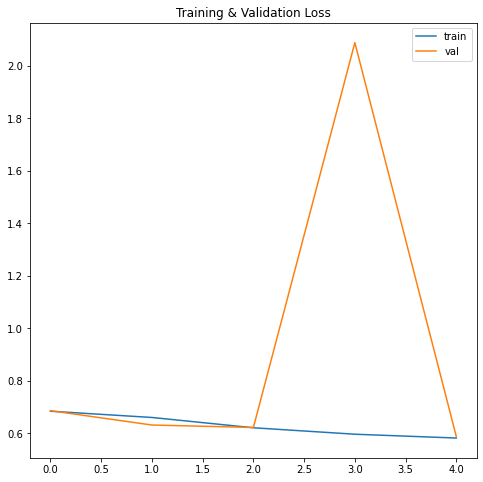

[Epoch 6, Batch 100] Training loss: 920.571
[Epoch 6, Batch 200] Training loss: 1819.989
[Epoch 6, Batch 300] Training loss: 2746.434
[Epoch 6, Batch 400] Training loss: 3655.830
[Epoch 6, Batch 500] Training loss: 4568.174
[Epoch 6, Batch 600] Training loss: 5455.519
[Epoch 6, Batch 700] Training loss: 6351.055
[Epoch 6, Batch 800] Training loss: 7211.514
[Epoch 6, Batch 900] Training loss: 8105.324
[Epoch 6, Batch 1000] Training loss: 8971.568
[Epoch 6, Batch 1100] Training loss: 9870.284
[Epoch 6, Batch 1200] Training loss: 10704.513
[Epoch 6, Batch 1300] Training loss: 11587.564
[Epoch 6, Batch 1400] Training loss: 12445.536
Epoch: 6/30:
Training loss: 0.55570 Epoch Train Acc: 0.72356.
Validation loss: 0.52241 Epoch Validation Acc: 0.74960.
Validation Loss Decreased (0.58739---->0.52241) 	 Saving Model..
model_20221113_055246.pt successfully saved!


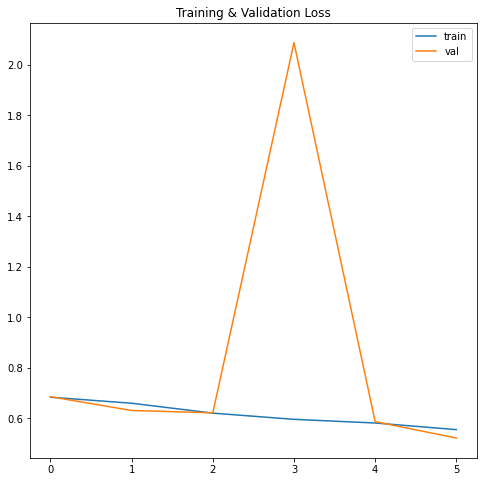

[Epoch 7, Batch 100] Training loss: 859.782
[Epoch 7, Batch 200] Training loss: 1698.531
[Epoch 7, Batch 300] Training loss: 2554.476
[Epoch 7, Batch 400] Training loss: 3413.346
[Epoch 7, Batch 500] Training loss: 4236.058
[Epoch 7, Batch 600] Training loss: 5133.599
[Epoch 7, Batch 700] Training loss: 5990.456
[Epoch 7, Batch 800] Training loss: 6865.702
[Epoch 7, Batch 900] Training loss: 7682.215
[Epoch 7, Batch 1000] Training loss: 8506.639
[Epoch 7, Batch 1100] Training loss: 9347.943
[Epoch 7, Batch 1200] Training loss: 10202.218
[Epoch 7, Batch 1300] Training loss: 11055.130
[Epoch 7, Batch 1400] Training loss: 11899.852
Epoch: 7/30:
Training loss: 0.53097 Epoch Train Acc: 0.74196.
Validation loss: 0.53344 Epoch Validation Acc: 0.74560.
[Epoch 8, Batch 100] Training loss: 848.241
[Epoch 8, Batch 200] Training loss: 1645.432
[Epoch 8, Batch 300] Training loss: 2500.554
[Epoch 8, Batch 400] Training loss: 3345.555
[Epoch 8, Batch 500] Training loss: 4199.038
[Epoch 8, Batch 600] 

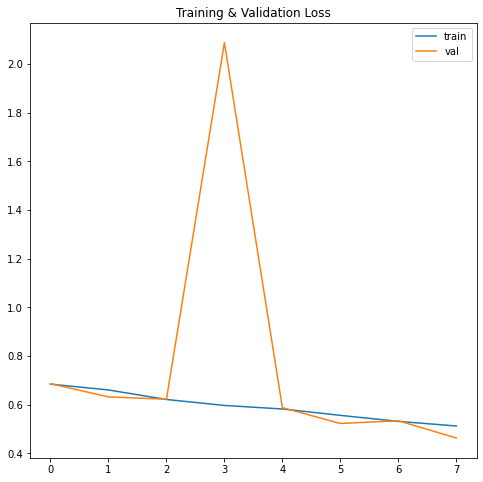

[Epoch 9, Batch 100] Training loss: 818.298
[Epoch 9, Batch 200] Training loss: 1633.704
[Epoch 9, Batch 300] Training loss: 2413.860
[Epoch 9, Batch 400] Training loss: 3209.944
[Epoch 9, Batch 500] Training loss: 4021.296
[Epoch 9, Batch 600] Training loss: 4832.716
[Epoch 9, Batch 700] Training loss: 5653.322
[Epoch 9, Batch 800] Training loss: 6404.971
[Epoch 9, Batch 900] Training loss: 7177.910
[Epoch 9, Batch 1000] Training loss: 7943.804
[Epoch 9, Batch 1100] Training loss: 8700.075
[Epoch 9, Batch 1200] Training loss: 9486.998
[Epoch 9, Batch 1300] Training loss: 10221.480
[Epoch 9, Batch 1400] Training loss: 10979.494
Epoch: 9/30:
Training loss: 0.48986 Epoch Train Acc: 0.77107.
Validation loss: 0.45820 Epoch Validation Acc: 0.78400.
Validation Loss Decreased (0.46246---->0.45820) 	 Saving Model..
model_20221113_062343.pt successfully saved!


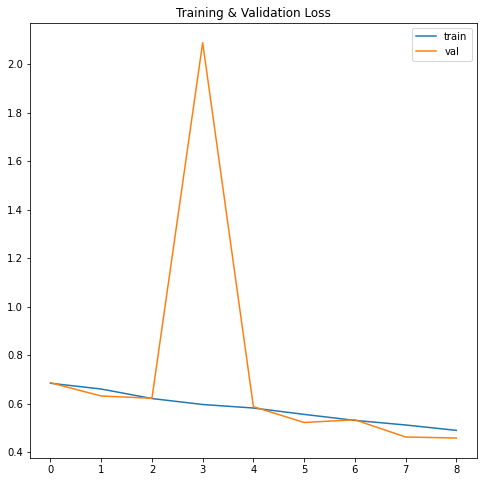

[Epoch 10, Batch 100] Training loss: 755.882
[Epoch 10, Batch 200] Training loss: 1519.975
[Epoch 10, Batch 300] Training loss: 2294.158
[Epoch 10, Batch 400] Training loss: 3053.393
[Epoch 10, Batch 500] Training loss: 3840.613
[Epoch 10, Batch 600] Training loss: 4624.425
[Epoch 10, Batch 700] Training loss: 5402.668
[Epoch 10, Batch 800] Training loss: 6197.809
[Epoch 10, Batch 900] Training loss: 6987.243
[Epoch 10, Batch 1000] Training loss: 7712.184
[Epoch 10, Batch 1100] Training loss: 8477.548
[Epoch 10, Batch 1200] Training loss: 9231.009
[Epoch 10, Batch 1300] Training loss: 10005.874
[Epoch 10, Batch 1400] Training loss: 10761.208
Epoch: 10/30:
Training loss: 0.48047 Epoch Train Acc: 0.77796.
Validation loss: 0.44479 Epoch Validation Acc: 0.80200.
Validation Loss Decreased (0.45820---->0.44479) 	 Saving Model..
model_20221113_063402.pt successfully saved!


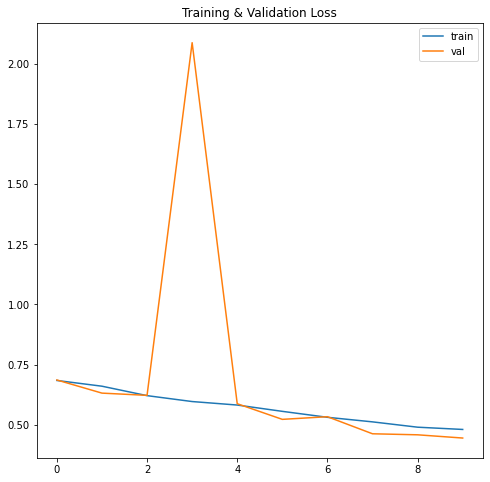

[Epoch 11, Batch 100] Training loss: 763.491
[Epoch 11, Batch 200] Training loss: 1519.038
[Epoch 11, Batch 300] Training loss: 2305.901
[Epoch 11, Batch 400] Training loss: 3075.610
[Epoch 11, Batch 500] Training loss: 3823.454
[Epoch 11, Batch 600] Training loss: 4568.811
[Epoch 11, Batch 700] Training loss: 5326.226
[Epoch 11, Batch 800] Training loss: 6065.559
[Epoch 11, Batch 900] Training loss: 6833.084
[Epoch 11, Batch 1000] Training loss: 7594.661
[Epoch 11, Batch 1100] Training loss: 8366.443
[Epoch 11, Batch 1200] Training loss: 9145.793
[Epoch 11, Batch 1300] Training loss: 9850.291
[Epoch 11, Batch 1400] Training loss: 10611.848
Epoch: 11/30:
Training loss: 0.47345 Epoch Train Acc: 0.78200.
Validation loss: 0.43966 Epoch Validation Acc: 0.80960.
Validation Loss Decreased (0.44479---->0.43966) 	 Saving Model..
model_20221113_064418.pt successfully saved!


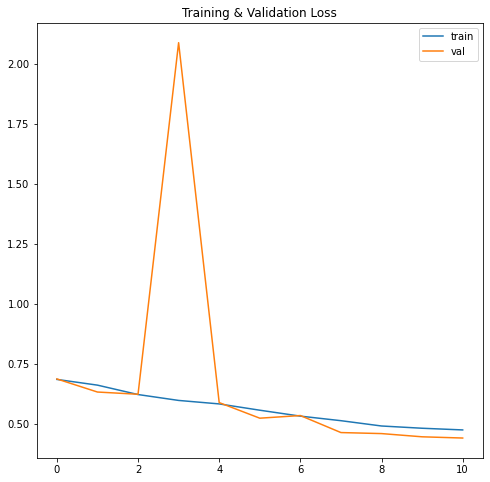

[Epoch 12, Batch 100] Training loss: 751.274
[Epoch 12, Batch 200] Training loss: 1452.552
[Epoch 12, Batch 300] Training loss: 2153.949
[Epoch 12, Batch 400] Training loss: 2861.590
[Epoch 12, Batch 500] Training loss: 3595.037
[Epoch 12, Batch 600] Training loss: 4342.751
[Epoch 12, Batch 700] Training loss: 5096.791
[Epoch 12, Batch 800] Training loss: 5848.966
[Epoch 12, Batch 900] Training loss: 6558.748
[Epoch 12, Batch 1000] Training loss: 7290.597
[Epoch 12, Batch 1100] Training loss: 8031.128
[Epoch 12, Batch 1200] Training loss: 8743.434
[Epoch 12, Batch 1300] Training loss: 9442.243
[Epoch 12, Batch 1400] Training loss: 10150.468
Epoch: 12/30:
Training loss: 0.45341 Epoch Train Acc: 0.79400.
Validation loss: 0.44118 Epoch Validation Acc: 0.80440.
[Epoch 13, Batch 100] Training loss: 719.191
[Epoch 13, Batch 200] Training loss: 1387.400
[Epoch 13, Batch 300] Training loss: 2104.706
[Epoch 13, Batch 400] Training loss: 2810.390
[Epoch 13, Batch 500] Training loss: 3575.952
[Ep

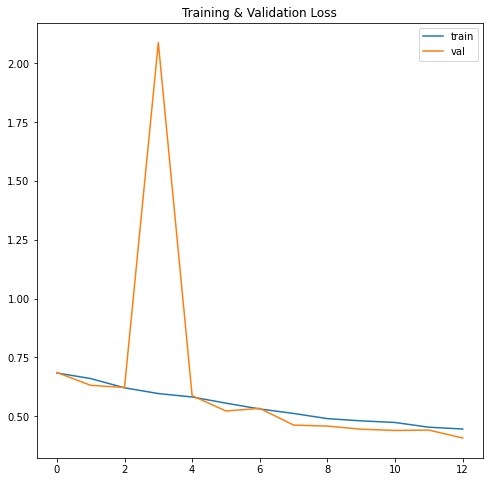

[Epoch 14, Batch 100] Training loss: 725.628
[Epoch 14, Batch 200] Training loss: 1397.801
[Epoch 14, Batch 300] Training loss: 2104.172
[Epoch 14, Batch 400] Training loss: 2843.653
[Epoch 14, Batch 500] Training loss: 3535.044
[Epoch 14, Batch 600] Training loss: 4225.019
[Epoch 14, Batch 700] Training loss: 4938.247
[Epoch 14, Batch 800] Training loss: 5573.303
[Epoch 14, Batch 900] Training loss: 6216.167
[Epoch 14, Batch 1000] Training loss: 6909.689
[Epoch 14, Batch 1100] Training loss: 7616.332
[Epoch 14, Batch 1200] Training loss: 8309.977
[Epoch 14, Batch 1300] Training loss: 9033.778
[Epoch 14, Batch 1400] Training loss: 9745.254
Epoch: 14/30:
Training loss: 0.43506 Epoch Train Acc: 0.80436.
Validation loss: 0.42144 Epoch Validation Acc: 0.80440.
[Epoch 15, Batch 100] Training loss: 668.121
[Epoch 15, Batch 200] Training loss: 1335.505
[Epoch 15, Batch 300] Training loss: 2003.498
[Epoch 15, Batch 400] Training loss: 2660.004
[Epoch 15, Batch 500] Training loss: 3302.109
[Epo

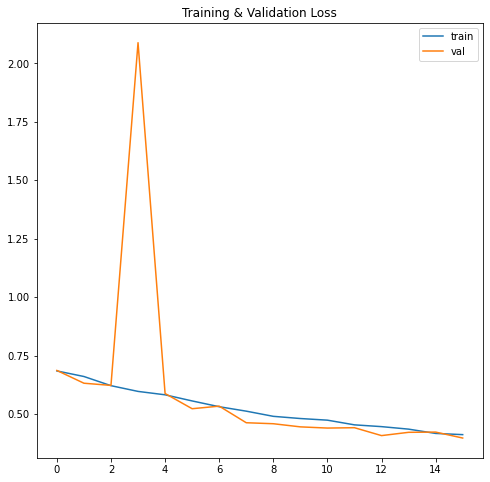

[Epoch 17, Batch 100] Training loss: 680.732
[Epoch 17, Batch 200] Training loss: 1286.902
[Epoch 17, Batch 300] Training loss: 1908.737
[Epoch 17, Batch 400] Training loss: 2624.891
[Epoch 17, Batch 500] Training loss: 3289.804
[Epoch 17, Batch 600] Training loss: 3970.457
[Epoch 17, Batch 700] Training loss: 4604.832
[Epoch 17, Batch 800] Training loss: 5307.525
[Epoch 17, Batch 900] Training loss: 5936.440
[Epoch 17, Batch 1000] Training loss: 6555.822
[Epoch 17, Batch 1100] Training loss: 7195.080
[Epoch 17, Batch 1200] Training loss: 7851.069
[Epoch 17, Batch 1300] Training loss: 8513.621
[Epoch 17, Batch 1400] Training loss: 9142.433
Epoch: 17/30:
Training loss: 0.40835 Epoch Train Acc: 0.81902.
Validation loss: 0.38697 Epoch Validation Acc: 0.82520.
Validation Loss Decreased (0.39702---->0.38697) 	 Saving Model..
model_20221113_074603.pt successfully saved!


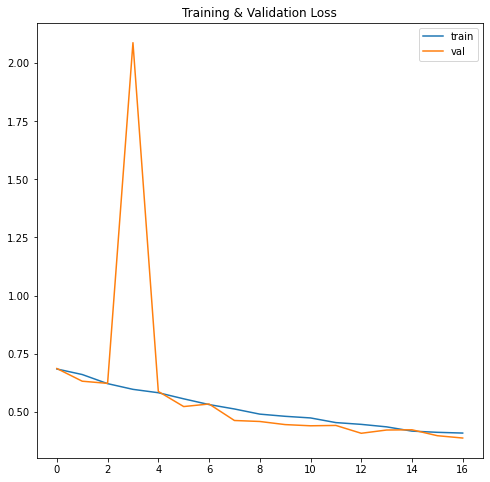

[Epoch 18, Batch 100] Training loss: 661.699
[Epoch 18, Batch 200] Training loss: 1343.093
[Epoch 18, Batch 300] Training loss: 1937.465
[Epoch 18, Batch 400] Training loss: 2571.113
[Epoch 18, Batch 500] Training loss: 3248.079
[Epoch 18, Batch 600] Training loss: 3852.654
[Epoch 18, Batch 700] Training loss: 4453.778
[Epoch 18, Batch 800] Training loss: 5080.235
[Epoch 18, Batch 900] Training loss: 5723.067
[Epoch 18, Batch 1000] Training loss: 6368.469
[Epoch 18, Batch 1100] Training loss: 6981.807
[Epoch 18, Batch 1200] Training loss: 7629.676
[Epoch 18, Batch 1300] Training loss: 8266.741
[Epoch 18, Batch 1400] Training loss: 8881.286
Epoch: 18/30:
Training loss: 0.39637 Epoch Train Acc: 0.82769.
Validation loss: 0.41145 Epoch Validation Acc: 0.82760.
[Epoch 19, Batch 100] Training loss: 596.375
[Epoch 19, Batch 200] Training loss: 1143.519
[Epoch 19, Batch 300] Training loss: 1775.476
[Epoch 19, Batch 400] Training loss: 2393.757
[Epoch 19, Batch 500] Training loss: 2976.406
[Epo

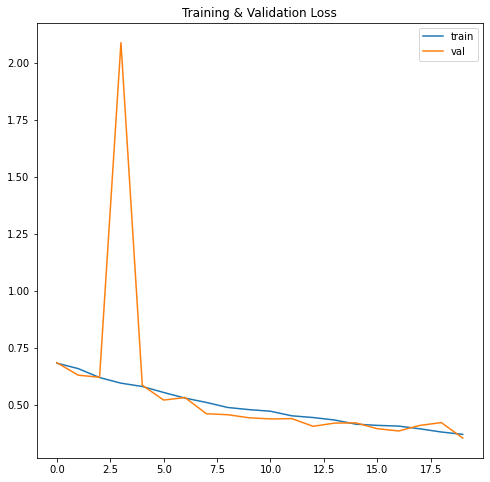

[Epoch 21, Batch 100] Training loss: 548.808
[Epoch 21, Batch 200] Training loss: 1113.957
[Epoch 21, Batch 300] Training loss: 1709.820
[Epoch 21, Batch 400] Training loss: 2327.969
[Epoch 21, Batch 500] Training loss: 2922.741
[Epoch 21, Batch 600] Training loss: 3519.153
[Epoch 21, Batch 700] Training loss: 4068.158
[Epoch 21, Batch 800] Training loss: 4617.822
[Epoch 21, Batch 900] Training loss: 5223.551
[Epoch 21, Batch 1000] Training loss: 5784.792
[Epoch 21, Batch 1100] Training loss: 6372.907
[Epoch 21, Batch 1200] Training loss: 6960.205
[Epoch 21, Batch 1300] Training loss: 7544.111
[Epoch 21, Batch 1400] Training loss: 8116.611
Epoch: 21/30:
Training loss: 0.36178 Epoch Train Acc: 0.84320.
Validation loss: 0.36042 Epoch Validation Acc: 0.83280.
[Epoch 22, Batch 100] Training loss: 565.465
[Epoch 22, Batch 200] Training loss: 1162.091
[Epoch 22, Batch 300] Training loss: 1787.302
[Epoch 22, Batch 400] Training loss: 2329.554
[Epoch 22, Batch 500] Training loss: 2937.250
[Epo

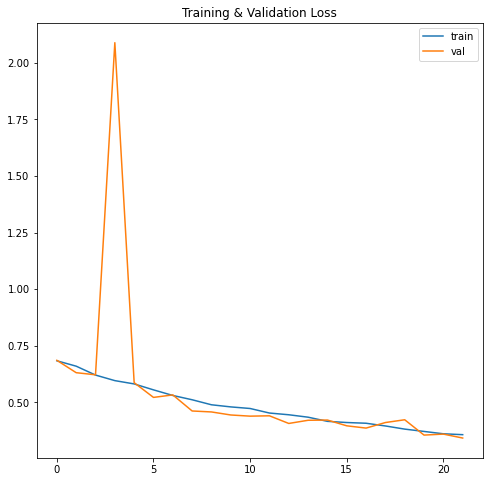

[Epoch 23, Batch 100] Training loss: 572.763
[Epoch 23, Batch 200] Training loss: 1120.263
[Epoch 23, Batch 300] Training loss: 1688.858
[Epoch 23, Batch 400] Training loss: 2231.794
[Epoch 23, Batch 500] Training loss: 2786.761
[Epoch 23, Batch 600] Training loss: 3301.461
[Epoch 23, Batch 700] Training loss: 3890.400
[Epoch 23, Batch 800] Training loss: 4396.054
[Epoch 23, Batch 900] Training loss: 4948.171
[Epoch 23, Batch 1000] Training loss: 5500.640
[Epoch 23, Batch 1100] Training loss: 6042.915
[Epoch 23, Batch 1200] Training loss: 6579.900
[Epoch 23, Batch 1300] Training loss: 7136.718
[Epoch 23, Batch 1400] Training loss: 7689.234
Epoch: 23/30:
Training loss: 0.34346 Epoch Train Acc: 0.84969.
Validation loss: 0.34028 Epoch Validation Acc: 0.85520.
Validation Loss Decreased (0.34306---->0.34028) 	 Saving Model..
model_20221113_084734.pt successfully saved!


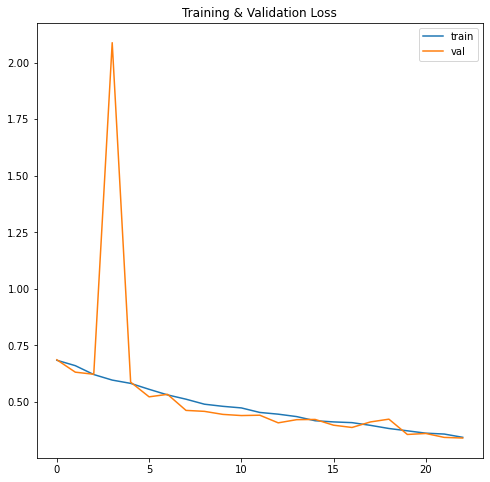

[Epoch 24, Batch 100] Training loss: 541.947
[Epoch 24, Batch 200] Training loss: 1065.957
[Epoch 24, Batch 300] Training loss: 1618.786
[Epoch 24, Batch 400] Training loss: 2171.245
[Epoch 24, Batch 500] Training loss: 2708.635
[Epoch 24, Batch 600] Training loss: 3261.065
[Epoch 24, Batch 700] Training loss: 3766.361
[Epoch 24, Batch 800] Training loss: 4344.226
[Epoch 24, Batch 900] Training loss: 4916.412
[Epoch 24, Batch 1000] Training loss: 5495.340
[Epoch 24, Batch 1100] Training loss: 6033.131
[Epoch 24, Batch 1200] Training loss: 6592.339
[Epoch 24, Batch 1300] Training loss: 7141.462
[Epoch 24, Batch 1400] Training loss: 7710.549
Epoch: 24/30:
Training loss: 0.34395 Epoch Train Acc: 0.85604.
Validation loss: 0.31715 Epoch Validation Acc: 0.86440.
Validation Loss Decreased (0.34028---->0.31715) 	 Saving Model..
model_20221113_085748.pt successfully saved!


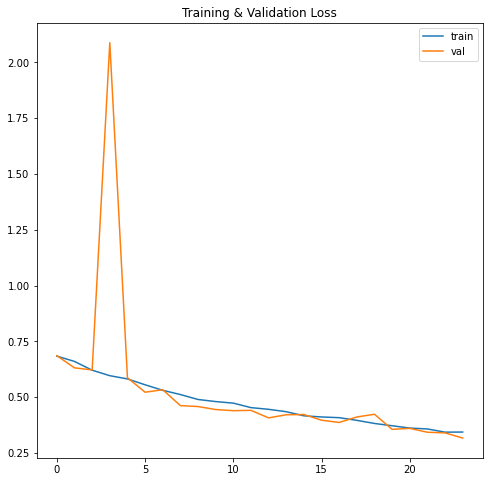

[Epoch 25, Batch 100] Training loss: 499.251
[Epoch 25, Batch 200] Training loss: 1003.113
[Epoch 25, Batch 300] Training loss: 1519.549
[Epoch 25, Batch 400] Training loss: 2049.608
[Epoch 25, Batch 500] Training loss: 2569.843
[Epoch 25, Batch 600] Training loss: 3091.036
[Epoch 25, Batch 700] Training loss: 3624.946
[Epoch 25, Batch 800] Training loss: 4190.108
[Epoch 25, Batch 900] Training loss: 4705.071
[Epoch 25, Batch 1000] Training loss: 5262.515
[Epoch 25, Batch 1100] Training loss: 5844.325
[Epoch 25, Batch 1200] Training loss: 6384.057
[Epoch 25, Batch 1300] Training loss: 6935.235
[Epoch 25, Batch 1400] Training loss: 7467.223
Epoch: 25/30:
Training loss: 0.33354 Epoch Train Acc: 0.85853.
Validation loss: 0.32473 Epoch Validation Acc: 0.86840.
[Epoch 26, Batch 100] Training loss: 516.041
[Epoch 26, Batch 200] Training loss: 1109.022
[Epoch 26, Batch 300] Training loss: 1648.804
[Epoch 26, Batch 400] Training loss: 2227.165
[Epoch 26, Batch 500] Training loss: 2768.560
[Epo

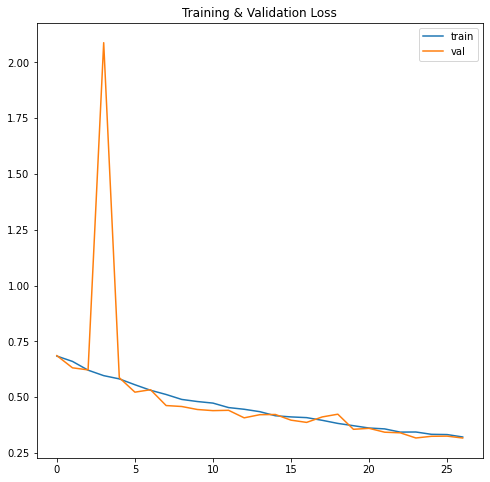

[Epoch 28, Batch 100] Training loss: 514.288
[Epoch 28, Batch 200] Training loss: 1021.074
[Epoch 28, Batch 300] Training loss: 1513.901
[Epoch 28, Batch 400] Training loss: 2064.566
[Epoch 28, Batch 500] Training loss: 2584.769
[Epoch 28, Batch 600] Training loss: 3153.474
[Epoch 28, Batch 700] Training loss: 3638.029
[Epoch 28, Batch 800] Training loss: 4095.676
[Epoch 28, Batch 900] Training loss: 4562.978
[Epoch 28, Batch 1000] Training loss: 5092.787
[Epoch 28, Batch 1100] Training loss: 5618.123
[Epoch 28, Batch 1200] Training loss: 6086.387
[Epoch 28, Batch 1300] Training loss: 6572.679
[Epoch 28, Batch 1400] Training loss: 7047.271
Epoch: 28/30:
Training loss: 0.31554 Epoch Train Acc: 0.86609.
Validation loss: 0.32976 Epoch Validation Acc: 0.86480.
[Epoch 29, Batch 100] Training loss: 505.794
[Epoch 29, Batch 200] Training loss: 1035.021
[Epoch 29, Batch 300] Training loss: 1525.713
[Epoch 29, Batch 400] Training loss: 2005.626
[Epoch 29, Batch 500] Training loss: 2509.623
[Epo

In [16]:
classifier.train(epochs=30,save=True)

In [30]:
#to load best checkpoint with lowest validation loss

classifier.load_model('model_20221113_092830.pt')

model_20221113_092830.pt successfully loaded...


# Generating prediction for testing set for use in submission

In [31]:
predictions,probabilities = classifier.test()

Predicting on test set to get metrics
Evaluating...Images 1600/12500
Evaluating...Images 3200/12500
Evaluating...Images 4800/12500
Evaluating...Images 6400/12500
Evaluating...Images 8000/12500
Evaluating...Images 9600/12500
Evaluating...Images 11200/12500


In [38]:
testset_filenames = classifier.dataMananger.testset.filenames
index = [int(x.split('.')[0]) for x in testset_filenames]
probs = [x[0] for x in probabilities]
preds = [x[0] for x in predictions]
df = pd.DataFrame(data={'id':index,'label':probs,'predictions':preds})
# df.sort_values('id').to_csv('submission.csv',index=False)

In [41]:
df_sub = df[['id','label']]

In [46]:
df_sub

,id,label
0,9054,0.462613
1,424,0.999703
2,12120,0.990657
3,8091,0.986247
4,10052,0.014716
...,...,...
12495,10582,0.094515
12496,7247,0.999500
12497,944,0.940520
12498,3058,0.007821


In [43]:
df_sub.sort_values('id').to_csv('submission.csv',index=False)

In [ ]:
# to download submission.csv and best model from kaggle
# from IPython.display import FileLink
# FileLink(r'submission.csv')

# from IPython.display import FileLink
# FileLink(r'artifact/checkpoint/model_20221113_092830.pt')

# Generating predictions for custom images

In [13]:
def test_single(file_path,saved_model):
    
    img = Image.open(file_path)
    mean=(0.485, 0.456, 0.406)
    std=(0.229, 0.224, 0.225)

    transform = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize(size=(224,224)),
        transforms.Normalize(mean, std)
    ])

    device = torch.device(torch.cuda.current_device() if torch.cuda.is_available() else 'cpu')
    img_normalized = transform(img).unsqueeze(0).to(device)
    best_model = Net().to(device)
    best_model.load_state_dict(torch.load(saved_model , map_location = device))
    
    with torch.no_grad():
        best_model.eval()
        output = best_model(img_normalized)
        prob = torch.sigmoid(output)
        y_hat = torch.round(prob)
        
    print(f"Picture is a {'Cat!' if y_hat.cpu().numpy()[0][0] == False else 'Dog!'} Probability of dog is {prob.cpu().numpy()[0][0]:.4f}")

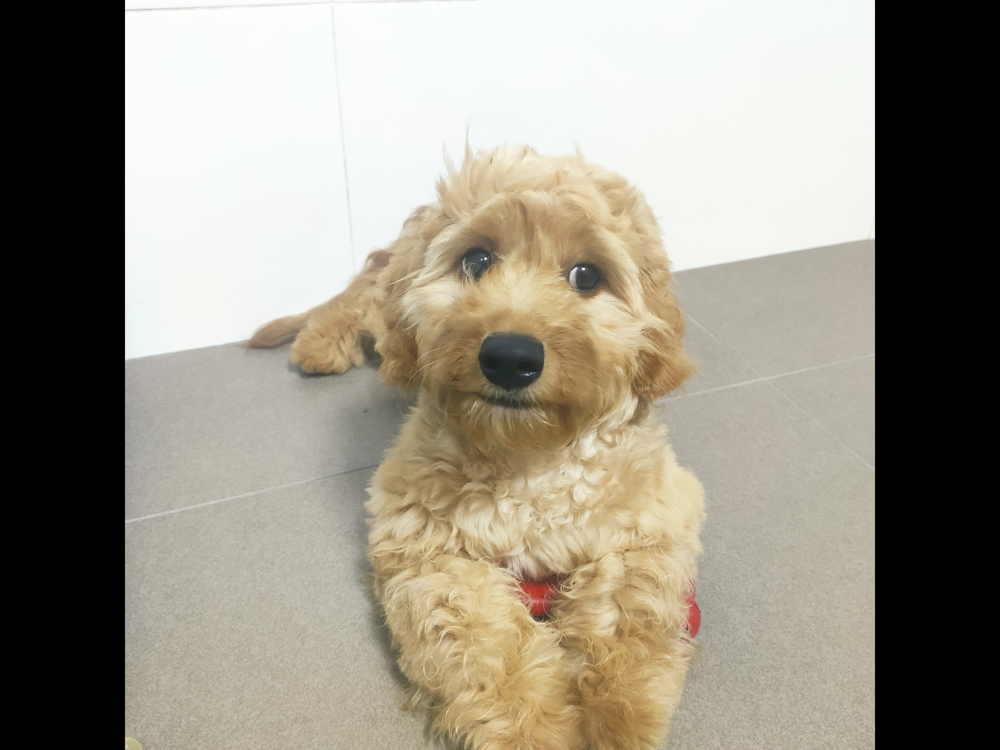

Picture is a Dog! Probability of dog is 0.8751


In [14]:
from PIL import Image

file  = 'IMG_20211108_113327.jpg'
img = Image.open(file).rotate(-90)
display(img)

test_single(file,'model_20221113_092830.pt')